<center><img src='https://drive.google.com/uc?id=1_utx_ZGclmCwNttSe40kYA6VHzNocdET' height="60">

AI TECH - Akademia Innowacyjnych Zastosowań Technologii Cyfrowych. Program Operacyjny Polska Cyfrowa na lata 2014-2020
<hr>

<img src='https://drive.google.com/uc?id=1BXZ0u3562N_MqCLcekI-Ens77Kk4LpPm'>


Projekt współfinansowany ze środków Unii Europejskiej w ramach Europejskiego Funduszu Rozwoju Regionalnego 
Program Operacyjny Polska Cyfrowa na lata 2014-2020,
Oś Priorytetowa nr 3 "Cyfrowe kompetencje społeczeństwa" Działanie  nr 3.2 "Innowacyjne rozwiązania na rzecz aktywizacji cyfrowej".   
Tytuł projektu:  „Akademia Innowacyjnych Zastosowań Technologii Cyfrowych (AI Tech)”
    </center>

# Statistical machine learning - Notebook 3, version for students
**Author: Michał Ciach**  
**Date: 29.10.2021**

## Description

In this notebook, we will learn one of the most common techniques of exploratory data analysis - the Principal Component Analysis (PCA).  
PCA is a transformation of the features (the columns of the data set) into *principal components*, which are weighted sums of the columns:
$$PC_i = w_{i1} X_1 + \dots + w_{ik}X_k,$$
where $X_1, \dots, X_k$ are the columns of our data frame and $w_{ij}$ is the weight associated with $i$-th principal component and $j$-th column. 

The first principal component corresponds to the direction of the largest variance of the data set - that is, the direction in which our data set is "biggest".  
Each next principal component is selected to maximize the variance in a subspace perpendicular to all the previous components.  
The transformation is defined so that for each principal component, the vector of weights has a unit length: $w_{i1}^2 + \dots + w_{ik}^2 = 1$. 

<center><img src='https://upload.wikimedia.org/wikipedia/commons/thumb/f/f5/GaussianScatterPCA.svg/1024px-GaussianScatterPCA.svg.png' height="400">

*Principal component analysis. Arrows represent the principal components.     
Source: https://commons.wikimedia.org/wiki/File:GaussianScatterPCA.svg*
</center>

PCA allows us to detect trends in high-dimentional data, reduce the number of dimentions, and visualize the data set on a two-dimentional scatter plot. This can be used, for example, to check if the data contains clusters.  

The weights $w_{ij}$ correspond to eigenvectors of the covariance matrix of the analyzed data frame. It turns out that the variance explained by the $i$-th principal component is equal to the $i$-th largest eigenvalue of the covariance matrix. A vector of weights multiplied by the square root of this variance is called a *loading* of the principal component.  

It follows that one way to perform PCA is to perform an eigenvalue decomposition (i.e. diagonalization) of the covariance matrix.  
A more computationally efficient way is based on the Singular Value Decomposition. The mathematical details are described in the lecture.  

PCA always assumes that the data is **centered** - meaning that values in each column sum up to zero.  
Note that this assumption is *de facto* satisfied if we perform PCA using the covariance matrix (from the definition of covariance of two random variables). 


 

Run the cell below to load the required data sets to the notebook's environment. 

In [1]:
!pip install gdown
!gdown https://drive.google.com/uc?id=1GW1pjKOCoKOlC4Jqbqql_ghYD_n0iC6O
!gdown https://drive.google.com/uc?id=1FInZ2jrlZGNColU4sHF9JKGHP39fTVut
!gdown https://drive.google.com/uc?id=1n1qS6dcVVKcVJOuUIIm0VTz6cSyrtzDH

Downloading...
From: https://drive.google.com/uc?id=1GW1pjKOCoKOlC4Jqbqql_ghYD_n0iC6O
To: /content/BDL municipality incomes 2015-2020.csv
100% 228k/228k [00:00<00:00, 64.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1FInZ2jrlZGNColU4sHF9JKGHP39fTVut
To: /content/BDL municipality area km2 2015-2020.csv
100% 180k/180k [00:00<00:00, 52.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1n1qS6dcVVKcVJOuUIIm0VTz6cSyrtzDH
To: /content/BDL municipality population 2015-2020.csv
100% 222k/222k [00:00<00:00, 31.3MB/s]


## Data & library imports

In addition to libraries used in the previous classes, we will use the `sklearn.decomposition.PCA` method to perform PCA. 

In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.decomposition import PCA

We'll now load the data for the first part of today's class. 

In [3]:
income = pd.read_csv('BDL municipality incomes 2015-2020.csv', sep=';', dtype={'Code': 'str'})

In [4]:
income.head()

,Code,Region,2015,2016,2017,2018,2019,2020
0,0201011,Bolesławiec (1),97766455.51,96585948.26,1.003549e+08,1.000265e+08,1.107985e+08,1.138563e+08
1,0201022,Bolesławiec (2),31072239.80,29138151.04,3.683091e+07,3.484836e+07,3.871533e+07,4.288890e+07
2,0201032,Gromadka (2),10899408.78,13139743.96,1.454154e+07,2.705794e+07,2.572157e+07,2.754443e+07
3,0201043,Nowogrodziec (3),18569147.18,29417467.57,3.188345e+07,3.178886e+07,3.913420e+07,3.341908e+07
4,0201052,Osiecznica (2),16746467.73,17098022.83,1.760182e+07,1.984173e+07,2.177626e+07,2.484304e+07


## Preprocessing  

**Exercise 1.** Perform the necessary cleaning of the `income` data frame - remove rows with missing values. 

In [5]:
## Write your code here
income.dropna(inplace=True)

In [6]:
income.isna().sum()

Code      0
Region    0
2015      0
2016      0
2017      0
2018      0
2019      0
2020      0
dtype: int64

## PCA of the income data set

**Exercise 2.** Perform a principal component analysis of the income using the `PCA` method from `sklearn`. Check in the documentation if you need to center the data yourself.   



In [7]:
features = ['2015', '2016', '2017', '2018', '2019', '2020']
fig = px.scatter_matrix(
    income,
    dimensions=features,
    color="Region"
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [8]:
## Write your code for PCA before transformation here
pca = PCA(n_components=6)
# Documentation: The input data is centered but not scaled for each feature before applying the SVD.
pca.fit(income[features])

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

Check if the weights of the transformation, stored in the `components_` attribute of the resulting variable, correspond to unit-length weights or loadings. Verify that they are perpendicular to each other. 

In [9]:
## Check the orthonormality of the transformation here
np.dot(pca.components_[0], pca.components_[1])

0.0

In [10]:
sum_1 = 0
sum_2 = 0
for i in range(len(pca.components_[0])):
  sum_1 += (pca.components_[0][i])**2
  sum_2 += (pca.components_[1][i])**2

print(f'{sum_1}, {sum_2}')

0.9999999999999999, 1.0000000000000004


Create a bar plot showing the percentage of variance explained by each principal component.

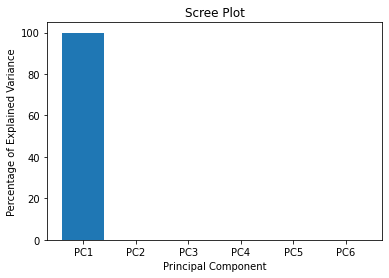

In [11]:
## Create the first bar plot here
import matplotlib.pyplot as plt

per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]
 
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

Create a scatter plot showing the first two principal components.   
Label the points with municipality names and territorial codes (in hover boxes). 

In [12]:
## Create the first scatter plot here

components = pca.fit_transform(income[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(2),
    color=income['Region'],
    hover_name=income["Code"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

Interpret the values of the weights for the first and second principal components (i.e. figure out what those components represent, and what can you say about municipalities in different parts of the scatter plot).  
Is the plot informative? If not, transform the data using a transformation of your choice. If you encounter numerical problems, try to figure out how to solve them.    


In [13]:
## Perform the transformation and PCA here.  

income2 = income.copy()
income_transform = income2.iloc[:, 2:8].transform(lambda x: np.log(x + 1))
income_transform['Code'] = income2['Code']
income_transform['Region'] = income2['Region']
income_transform

,2015,2016,2017,2018,2019,2020,Code,Region
0,18.398092,18.385944,18.424223,18.420946,18.523224,18.550448,0201011,Bolesławiec (1)
1,17.251825,17.187559,17.421848,17.366517,17.471746,17.574124,0201022,Bolesławiec (2)
2,16.204219,16.391152,16.492520,17.113491,17.062841,17.131311,0201032,Gromadka (2)
3,16.737012,17.197099,17.277598,17.274626,17.482507,17.324638,0201043,Nowogrodziec (3)
4,16.633698,16.654473,16.683513,16.803298,16.896331,17.028088,0201052,Osiecznica (2)
...,...,...,...,...,...,...,...,...
2504,16.539115,16.488681,16.595008,16.685249,16.683431,16.781622,3218043,Resko (3)
2505,16.185481,16.154840,16.197504,16.301508,16.425143,17.035963,3218053,Węgorzyno (3)
2506,19.412925,19.482364,19.537149,19.597985,19.653916,19.766334,3261011,Koszalin (1)
2507,21.023613,21.039569,21.018486,21.082216,21.158536,21.276584,3262011,Szczecin (1)


In [16]:
pca2 = PCA(n_components=6)
# Documentation: The input data is centered but not scaled for each feature before applying the SVD.
pca2.fit(income_transform[features])

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [17]:
np.dot(pca.components_[0], pca.components_[1])

0.0

Create the bar plot and the scatter plot after the transformation.   
Did the result improve? What can you say about the data based on the two scatter plots?  
**Hint:** You can use `income.iloc[, i:j]` to select all rows and columns from `i` to `j-1`.  

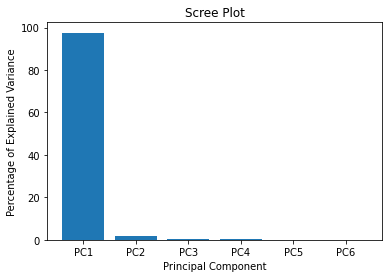

In [18]:
## Create the second bar plot here

per_var = np.round(pca2.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]
 
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

In [19]:
## Create the second scatter plot here


components = pca2.fit_transform(income_transform[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca2.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=income_transform['Region'],
    hover_name=income_transform["Code"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

### Outliers
When analyzing the scatter plots above, you may notice a data point that is very far away from all the others - the Boguszów-Gorce municipality (code 0221011).   
Such data points are called *outliers*. Often, if they are not representative of the data, they are removed from the data set.  
To understand why, we will analyze their influence on the principal components.  

**Exercise 3.** Select rows from 0 to 200 from the `income` data frame.  
Apply a transformation $f(x) = \log_{10}(x+1)$ to the data.  
Perform a principal component analysis and analyze the first two principal components.  


In [20]:
## Write your code here.  
first_200_rows = income_transform.iloc[0:199, :]
pca3 = PCA(n_components=6)
# Documentation: The input data is centered but not scaled for each feature before applying the SVD.
pca3.fit(first_200_rows[features])

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

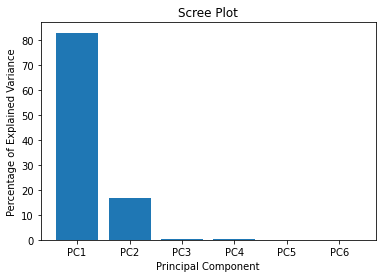

In [21]:
per_var = np.round(pca3.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]
 
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

In [22]:
components = pca3.fit_transform(first_200_rows[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca3.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=first_200_rows['Region'],
    hover_name=first_200_rows["Code"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

Next, select rows from 110 to 140 from the `income` data frame and repeat the procedure.  
Can you figure out the effect of the outlying observation on the direction of the principal components, and why?  
Remove the outlying observation using `pd.drop()` and repeat the Principal Component Analysis from the previous exercise.  

In [29]:
## Analyze the results here.  

rows_110_to_140 = income_transform.iloc[108:139, :]
pca4 = PCA(n_components=6)
# Documentation: The input data is centered but not scaled for each feature before applying the SVD.
pca4.fit(rows_110_to_140[features])

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

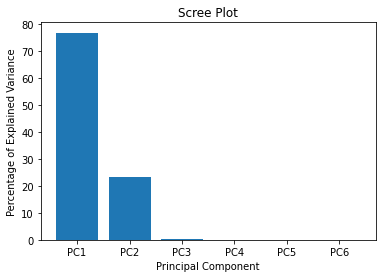

In [31]:
## Analyze the results here.  

per_var = np.round(pca4.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]
 
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

In [32]:
components = pca4.fit_transform(rows_110_to_140[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca4.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(3),
    color=rows_110_to_140['Region'],
    hover_name=rows_110_to_140["Code"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [35]:
## Remove the outlier and repeat the PCA here.  

income_transform_without_outlier = income_transform[income_transform['Code'] != '0221011']
pca5 = PCA(n_components=6)
# Documentation: The input data is centered but not scaled for each feature before applying the SVD.
pca5.fit(income_transform_without_outlier[features])

PCA(copy=True, iterated_power='auto', n_components=6, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

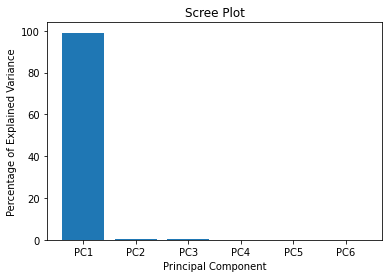

In [36]:
## Create your bar plot of explained variance here
per_var = np.round(pca5.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]
 
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

In [37]:
## Create your scatter plot here

components = pca5.fit_transform(income_transform_without_outlier[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca5.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(3),
    color=income_transform_without_outlier['Region'],
    hover_name=income_transform_without_outlier["Code"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

**Exercise 4.** Write a function that takes an array of numerical values (e.g. a data frame or a numpy array), performs the principal component analysis based on the correlation matrix, and returns a matrix of **loadings**. Use this matrix to calculate the explained variance ratio and the principal components on the `income` data set. Compare your results to the `sklearn` implementation.     
**Hint:** You can perform the eigenvalue decomposition using `numpy.linalg.eig`. Remember about the ordering of the eigenvectors.  
Remember that PCA assumes that the data is centered.  
If you find that you need to center the data yourself, you may use `np.mean(X, axis=0)` to get a vector with mean values of the columns of the matrix `X`.  
If you need to use matrix multiplication at some point, you may use `np.dot` (numpy performs an element-wise multiplication by default).   

In [45]:
import warnings
warnings.filterwarnings('ignore')

In [146]:
## Write your function here.  
from sklearn import preprocessing
def pca_from_covariance_matrix(df, verbose=False):
  cols = list(df.select_dtypes([np.number]).columns)
  for col in cols:
    df[col] = preprocessing.scale(df[col], with_mean='True', with_std='False')
  X = df[cols].to_numpy()
  V = np.cov(X.T)

  eigen_values, eigen_vectors = np.linalg.eig(V)
  #sort the eigenvalues in descending order
  sorted_index = np.argsort(eigen_values)[::-1]
  sorted_eigenvalue = eigen_values[sorted_index]
  #similarly sort the eigenvectors 
  sorted_eigenvectors = eigen_vectors[:,sorted_index]
  
  if verbose:
    print('Eigenvalues: ')
    print(sorted_eigenvalue)
    print('Eigenvectors: ')
    print(sorted_eigenvectors)
    print('Loadings matrix: ')
    print(sorted_eigenvectors * np.sqrt(eigenvalues))
  return sorted_eigenvalue, sorted_eigenvectors, sorted_eigenvectors * np.sqrt(eigenvalues)

In [147]:
## Use your implementation to perform PCA on a selected data frame. 
## Retrieve the explained variance from the loading matrix.
## Compare it to explained_variance_ from the sklearn results.  
pca_from_covariance_matrix(income_transform_without_outlier, verbose=True)
eigenvalues, eigenvectors, loadings_matrix = pca_from_covariance_matrix(income_transform_without_outlier)

print(f'Explained variance from sklearn: \n {pca5.explained_variance_}')
print(f'Loadings matrix from sklearn: \n {pca5.components_.T * np.sqrt(pca5.explained_variance_)}')


Eigenvalues: 
[5.94517519e+00 2.51569122e-02 1.30308961e-02 8.43952300e-03
 6.21008179e-03 4.44239215e-03]
Eigenvectors: 
[[ 4.07664003e-01 -4.49893139e-01  6.79437668e-01  3.40395559e-01
  -1.78227300e-01  1.48783644e-01]
 [ 4.08998579e-01 -2.61887448e-01  6.55390858e-04 -2.87342711e-01
   5.05231380e-01 -6.52924281e-01]
 [ 4.08951407e-01 -2.10265747e-01 -2.47405257e-01 -4.85325882e-01
   1.65071479e-01  6.81577506e-01]
 [ 4.08919324e-01 -7.83659320e-02 -4.06088609e-01 -6.14799231e-02
  -7.62751338e-01 -2.75982651e-01]
 [ 4.08518744e-01  2.06698195e-01 -4.06242267e-01  7.16219482e-01
   3.18700004e-01  1.03997466e-01]
 [ 4.06431288e-01  7.97454752e-01  3.83684670e-01 -2.21976780e-01
  -4.86661336e-02 -4.84949823e-03]]
Loadings matrix: 
[[ 9.93996128e-01 -7.13572388e-02  7.75598144e-02  3.12710768e-02
  -1.40450370e-02  9.91661923e-03]
 [ 9.97250190e-01 -4.15377865e-02  7.48148000e-05 -2.63972773e-02
   3.98142902e-02 -4.35182343e-02]
 [ 9.97135170e-01 -3.33501044e-02 -2.82420400e-02 -

In [102]:
X_reduced = np.dot(eigenvectors.T, income_transform_without_outlier[features].T).T
X_reduced

array([[ 4.47755130e+00, -1.41079662e-01,  8.22264493e-02,
         2.14697087e-03,  4.04214226e-02,  1.42490439e-02],
       [ 1.99980716e+00, -6.35197926e-02,  6.97885691e-03,
        -3.32900608e-02, -2.25175500e-03,  1.18035957e-01],
       [ 5.08268619e-01,  3.47359951e-01, -3.69090727e-01,
         9.49567251e-02, -2.63529008e-01, -1.07333989e-01],
       ...,
       [ 7.08129944e+00,  3.58367034e-02,  6.14954766e-02,
        -3.32856153e-02, -4.49309466e-04, -1.20617800e-03],
       [ 1.06094540e+01,  5.75818413e-02,  1.91486860e-01,
         5.39115393e-03,  1.08924318e-02, -2.28056997e-02],
       [ 6.11700255e+00, -6.02959563e-03, -3.09062334e-02,
        -3.95429311e-01, -1.13054075e-01, -1.64373156e-01]])

In [130]:
## Create a scatter plot of principal components here.  

pca_from_covariance_explained_variance = eigenvalues/sum(eigenvalues)

components = X_reduced
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca_from_covariance_explained_variance * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(3),
    color=income_transform_without_outlier['Region'],
    hover_name=income_transform_without_outlier["Code"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [99]:
components = pca5.fit_transform(income_transform_without_outlier[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca5.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(3),
    color=income_transform_without_outlier['Region'],
    hover_name=income_transform_without_outlier["Code"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

**Exercise 5 - Homework.** Search Google on how to perform a Singular Value Decomposition of a matrix in Python.  
Write a function that performs the principal component analysis using the Singular Value Decomposition (described in the lecture).  
Check if it returns the same loading matrix as the function that uses the eigenvectors.

In [230]:
from scipy.linalg import svd

def pca_from_svd(df, verbose=False):
  cols = list(df.select_dtypes([np.number]).columns)
  for col in cols:
    df[col] = preprocessing.scale(df[col], with_mean='True', with_std='False')
  X = df[cols].to_numpy()

  u, d, vt = np.linalg.svd(X, full_matrices=False) 

  # Principal components are given by Z = UD
  components  = u * d
  print(f'Components: \n {components}')
  # Loadings (rotations) V
  loadings = vt
  print(f'Loadings: \n {loadings}')
  return components, loadings

In [231]:
components_svd, loadings_svd = pca_from_svd(income_transform_without_outlier)

Components: 
 [[-4.47755130e+00  1.41079662e-01  8.22264493e-02 -2.14697087e-03
  -4.04214226e-02 -1.42490439e-02]
 [-1.99980716e+00  6.35197926e-02  6.97885691e-03  3.32900608e-02
   2.25175500e-03 -1.18035957e-01]
 [-5.08268619e-01 -3.47359951e-01 -3.69090727e-01 -9.49567251e-02
   2.63529008e-01  1.07333989e-01]
 ...
 [-7.08129944e+00 -3.58367034e-02  6.14954766e-02  3.32856153e-02
   4.49309466e-04  1.20617800e-03]
 [-1.06094540e+01 -5.75818413e-02  1.91486860e-01 -5.39115393e-03
  -1.08924318e-02  2.28056997e-02]
 [-6.11700255e+00  6.02959563e-03 -3.09062334e-02  3.95429311e-01
   1.13054075e-01  1.64373156e-01]]
Loadings: 
 [[-4.07664003e-01 -4.08998579e-01 -4.08951407e-01 -4.08919324e-01
  -4.08518744e-01 -4.06431288e-01]
 [ 4.49893139e-01  2.61887448e-01  2.10265747e-01  7.83659320e-02
  -2.06698195e-01 -7.97454752e-01]
 [ 6.79437668e-01  6.55390857e-04 -2.47405257e-01 -4.06088609e-01
  -4.06242267e-01  3.83684670e-01]
 [-3.40395559e-01  2.87342711e-01  4.85325882e-01  6.147992

## PCA + clustering

We will now learn how to use PCA to visualize clustering of multi-dimentional data.   
In this part of the class, we'll use the `iris` data set.  
This data set is so famous it even has its own [Wikipedia article](https://en.wikipedia.org/wiki/Iris_flower_data_set).  
It's available in the `sklearn` library and can be loaded as follows:

In [232]:
from sklearn import datasets
iris_raw = datasets.load_iris()

**Exercise 6.** Check the contents of the `iris_raw` variable.  
Use it to create a data frame called `iris` with the flower's measurements and species.  
**Hint.** You can use `iris_raw.feature_names` to get the column names for the measurements.  

In [233]:
iris = np.concatenate((iris_raw.data, iris_raw.target[:, None]), axis=1)
iris = pd.DataFrame(iris, columns=iris_raw.feature_names + ['tgt_num'])
mapped = dict(zip([0, 1, 2], iris_raw.target_names))
iris.loc[:, 'species'] = iris.tgt_num.map(mapped)
iris.drop('tgt_num', axis=1,  inplace=True)
iris

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


**Exercise 7.** Perform a principal component analysis on the numerical columns of the `iris` data frame.  
Interpret the weights of the first principal component.  
Next, perform a k-means clustering of the data frame (again, using only the numerical columns) into a number of clusters of your choice. 
Plot the first two principal components with the point color corresponding to species and the marker shape corresponding to the cluster label.  
Transform the cluster centers and highlight them on the plot with cross signs.  
**Hint.** Adding points to a scatter plot was covered in Notebook 1.  

In [265]:
## Write your PCA code here.  
from sklearn import preprocessing

features = ['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']
X = iris[features].copy()
X = X.apply(lambda x: x-x.mean())
iris[features] = X
pca = PCA(n_components=3)
components = pca.fit_transform(X)


labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(3),
    color=iris["species"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [272]:
## Cluster the data set here.  
from sklearn.cluster import KMeans, AgglomerativeClustering

kmeans = KMeans(n_clusters= 3, max_iter = 500)
km = kmeans.fit(components)

In [273]:
km.cluster_centers_

array([[ 0.57262144, -0.80720888,  0.04824323],
       [-2.22475316,  0.28892745, -0.0428391 ],
       [ 1.72103664,  0.60288719, -0.00882843]])

In [275]:
cluster_kmeans = km.predict(components)
cluster_kmeans

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2,
       0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 2, 2, 2,
       2, 2, 2, 0, 0, 2, 2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2,
       2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 0], dtype=int32)

In [276]:
iris['cluster'] = cluster_kmeans
iris

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species,cluster
0,-0.900681,1.019004,-1.340227,-1.315444,setosa,1
1,-1.143017,-0.131979,-1.340227,-1.315444,setosa,1
2,-1.385353,0.328414,-1.397064,-1.315444,setosa,1
3,-1.506521,0.098217,-1.283389,-1.315444,setosa,1
4,-1.021849,1.249201,-1.340227,-1.315444,setosa,1
...,...,...,...,...,...,...
145,1.038005,-0.131979,0.819596,1.448832,virginica,2
146,0.553333,-1.282963,0.705921,0.922303,virginica,0
147,0.795669,-0.131979,0.819596,1.053935,virginica,2
148,0.432165,0.788808,0.933271,1.448832,virginica,2


In [277]:
## Create your scatter plot here.  

import plotly.graph_objects as go
fig = px.scatter(components, x=0, y=1, color=iris['species'], symbol=iris['cluster'])
fig.add_trace(go.Scatter(x=km.cluster_centers_[:, 0], y=km.cluster_centers_[:, 1], mode='markers', marker=go.scatter.Marker(symbol='x',size=12, color = 'black'), showlegend=False))
fig.show()

<center><img src='https://drive.google.com/uc?id=1_utx_ZGclmCwNttSe40kYA6VHzNocdET' height="60">

AI TECH - Akademia Innowacyjnych Zastosowań Technologii Cyfrowych. Program Operacyjny Polska Cyfrowa na lata 2014-2020
<hr>

<img src='https://drive.google.com/uc?id=1BXZ0u3562N_MqCLcekI-Ens77Kk4LpPm'>


Projekt współfinansowany ze środków Unii Europejskiej w ramach Europejskiego Funduszu Rozwoju Regionalnego 
Program Operacyjny Polska Cyfrowa na lata 2014-2020,
Oś Priorytetowa nr 3 "Cyfrowe kompetencje społeczeństwa" Działanie  nr 3.2 "Innowacyjne rozwiązania na rzecz aktywizacji cyfrowej".   
Tytuł projektu:  „Akademia Innowacyjnych Zastosowań Technologii Cyfrowych (AI Tech)”
    </center>